<h1>Inhaltsverzeichnis<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Laden-des-Datensatzes" data-toc-modified-id="Laden-des-Datensatzes-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Laden des Datensatzes</a></span></li><li><span><a href="#Verteilung-der-Dateilängen" data-toc-modified-id="Verteilung-der-Dateilängen-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Verteilung der Dateilängen</a></span></li><li><span><a href="#Wordclouds" data-toc-modified-id="Wordclouds-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Wordclouds</a></span><ul class="toc-item"><li><span><a href="#Vorbereitung" data-toc-modified-id="Vorbereitung-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Vorbereitung</a></span></li><li><span><a href="#WordCloud-(Business)" data-toc-modified-id="WordCloud-(Business)-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>WordCloud (Business)</a></span></li><li><span><a href="#WordCloud-(Entertainment)" data-toc-modified-id="WordCloud-(Entertainment)-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>WordCloud (Entertainment)</a></span></li><li><span><a href="#WordCloud-(Politics)" data-toc-modified-id="WordCloud-(Politics)-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>WordCloud (Politics)</a></span></li><li><span><a href="#WordCloud-(Sport)" data-toc-modified-id="WordCloud-(Sport)-3.5"><span class="toc-item-num">3.5&nbsp;&nbsp;</span>WordCloud (Sport)</a></span></li><li><span><a href="#WordCloud-(Technology)" data-toc-modified-id="WordCloud-(Technology)-3.6"><span class="toc-item-num">3.6&nbsp;&nbsp;</span>WordCloud (Technology)</a></span></li></ul></li><li><span><a href="#Worthäufigkeitsverteilungen-nach-Kategorien" data-toc-modified-id="Worthäufigkeitsverteilungen-nach-Kategorien-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Worthäufigkeitsverteilungen nach Kategorien</a></span><ul class="toc-item"><li><span><a href="#Anzahl-der-Dateien-pro-Kategorie" data-toc-modified-id="Anzahl-der-Dateien-pro-Kategorie-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Anzahl der Dateien pro Kategorie</a></span></li><li><span><a href="#Artikellänge-pro-Kategorie" data-toc-modified-id="Artikellänge-pro-Kategorie-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Artikellänge pro Kategorie</a></span></li></ul></li></ul></div>

# Laden des Datensatzes

In [35]:
import pandas as pd
import numpy as np
from collections import Counter

import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [7]:
df = pd.read_csv("../../Datensaetze/news_POS_POS_tags_nouns_adjectives_verb.csv")
#del df['Unnamed: 0']
df.head(2)

,category,filename,title,content,number_of_tokens,number_of_types,stemmed_text,POS_tags,POS,nouns,adjectives,verb
0,business,001.txt,Ad sales boost Time Warner profit,Quarterly profits at US media giant TimeWarne...,415.0,244.0,quarterli profit at US media giant timewarn j...,"['_SP', 'NNP', 'NNS', 'IN', 'NNP', 'NNS', 'NN'...",high fourth own fourth underlying exceptional ...,74.0,22.0,1.0
1,business,002.txt,Dollar gains on Greenspan speech,The dollar has hit its highest level against ...,379.0,230.0,the dollar ha hit it highest level against th...,"['_SP', 'DT', 'NN', 'VBZ', 'VBN', 'PRP$', 'JJS...",late recent sanguine current current next shar...,66.0,30.0,9.0


In [5]:
#df.to_csv("../../Datensaetze/news_POS_POS_tags_nouns_adjectives_verb.csv", index=False)

# Verteilung der Dateilängen

In [12]:
files = np.unique(df.filename)
print(len(np.unique(df.filename)))

511


In [10]:
mean ={}
for a in files:
    mean[a] = int(np.mean(df.number_of_tokens[df.filename==a]))

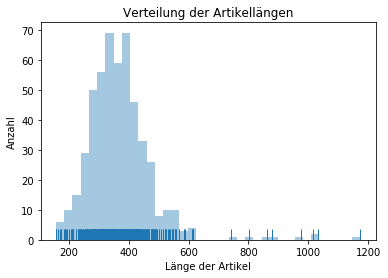

In [83]:
ax = sns.distplot(list(mean.values()), rug=True, kde=False)
ax.set_xlabel("Länge der Artikel")
ax.set_ylabel("Anzahl")
ax.set_title("Verteilung der Artikellängen")
#plt.savefig("../../Bilder/Datenexploration/Anzahl_Laenge_Kategorie/Verteilung_der_Artikellängen")
plt.show()

In [21]:
df.filename.shape

(2225,)

# Wordclouds

## Vorbereitung

In [22]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

cv = CountVectorizer(max_features=2000, min_df=10, max_df=300, stop_words='english')
cv.fit(df['POS'])

results = cv.transform(df['POS'])

features = cv.get_feature_names()

In [23]:
df_res = pd.DataFrame(results.toarray(), columns=features)
df_res = df_res.set_index(df.category)

In [24]:
df_res.loc['sum']=df_res.sum()
df_res = df_res.div(df_res.sum(axis=1), axis=0)

In [25]:
df_res.sort_values(by=['sum'], axis=1, inplace=True, ascending=False)
df_res

music      film  election  technology    mobile    party  \
category                                                                
business  0.016393  0.032787  0.000000    0.000000  0.000000  0.00000   
business  0.000000  0.000000  0.000000    0.000000  0.000000  0.00000   
business  0.000000  0.000000  0.000000    0.000000  0.000000  0.00000   
business  0.000000  0.000000  0.000000    0.000000  0.000000  0.00000   
business  0.000000  0.000000  0.000000    0.000000  0.000000  0.00000   
...            ...       ...       ...         ...       ...      ...   
tech      0.000000  0.000000  0.000000    0.000000  0.000000  0.00000   
tech      0.000000  0.000000  0.000000    0.005882  0.000000  0.00000   
tech      0.000000  0.000000  0.000000    0.000000  0.000000  0.00000   
tech      0.000000  0.000000  0.000000    0.000000  0.000000  0.00000   
sum       0.005840  0.005679  0.004729    0.004146  0.003648  0.00361   

                tv    growth     money   british   economy     think  \
category                                                               
business  0.000000  0.016393  0.000000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.000000  0.000000  0.000000  0.012987   
business  0.000000  0.000000  0.020408  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
...            ...       ...       ...       ...       ...       ...   
tech      0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
tech      0.005882  0.000000  0.000000  0.005882  0.000000  0.000000   
tech      0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
tech      0.012407  0.004963  0.000000  0.000000  0.000000  0.012407   
sum       0.003510  0.003403  0.003326  0.003250  0.003211  0.003181   

               net       tax  director    group   service      want  industry  \
category                                                                        
business  0.000000  0.000000  0.000000  0.00000  0.016393  0.000000  0.000000   
business  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000   
business  0.000000  0.040816  0.020408  0.00000  0.000000  0.000000  0.000000   
business  0.000000  0.015385  0.000000  0.00000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000   
...            ...       ...       ...      ...       ...       ...       ...   
tech      0.016393  0.000000  0.016393  0.00000  0.000000  0.000000  0.016393   
tech      0.000000  0.000000  0.000000  0.00000  0.000000  0.005882  0.005882   
tech      0.057692  0.000000  0.019231  0.00000  0.000000  0.000000  0.000000   
tech      0.000000  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000   
sum       0.003181  0.003173  0.003119  0.00302  0.002974  0.002966  0.002943   

              half    record     team  business      work       day     phone  \
category                                                                        
business  0.000000  0.000000  0.00000  0.016393  0.000000  0.000000  0.000000   
business  0.012987  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
...            ...       ...      ...       ...       ...       ...       ...   
tech      0.000000  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
tech      0.000000  0.000000  0.00000  0.000000  0.000000  0.005882  0.000000   
tech      0.000000  0.000000  0.00000  0.000000  0.038462  0.019231  0.000000   
tech      0.002481  0.000000  0.00000  0.002481  0.014888  0.022333  0.000000   
sum       0.002935  0.002928  0.00292  0.002874  0.002874  0.002866  0.002843   

               big

In [26]:
#df_res.to_csv('../../Datensaetze/word_frequencies_by_category_and_pos.csv')

In [27]:
df_res = pd.read_csv("../../Datensaetze/word_frequencies_by_category_and_pos.csv")

In [29]:
df_res = df_res.set_index(df_res.category)
df_res

category     music      film  election  technology    mobile  \
category                                                                 
business  business  0.016393  0.032787  0.000000    0.000000  0.000000   
business  business  0.000000  0.000000  0.000000    0.000000  0.000000   
business  business  0.000000  0.000000  0.000000    0.000000  0.000000   
business  business  0.000000  0.000000  0.000000    0.000000  0.000000   
business  business  0.000000  0.000000  0.000000    0.000000  0.000000   
...            ...       ...       ...       ...         ...       ...   
tech          tech  0.000000  0.000000  0.000000    0.000000  0.000000   
tech          tech  0.000000  0.000000  0.000000    0.005882  0.000000   
tech          tech  0.000000  0.000000  0.000000    0.000000  0.000000   
tech          tech  0.000000  0.000000  0.000000    0.000000  0.000000   
sum            sum  0.005840  0.005679  0.004729    0.004146  0.003648   

            party        tv    growth     money   british   economy     think  \
category                                                                        
business  0.00000  0.000000  0.016393  0.000000  0.000000  0.000000  0.000000   
business  0.00000  0.000000  0.000000  0.000000  0.000000  0.000000  0.012987   
business  0.00000  0.000000  0.000000  0.020408  0.000000  0.000000  0.000000   
business  0.00000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
business  0.00000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
...           ...       ...       ...       ...       ...       ...       ...   
tech      0.00000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
tech      0.00000  0.005882  0.000000  0.000000  0.005882  0.000000  0.000000   
tech      0.00000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
tech      0.00000  0.012407  0.004963  0.000000  0.000000  0.000000  0.012407   
sum       0.00361  0.003510  0.003403  0.003326  0.003250  0.003211  0.003181   

               net       tax  director    group   service      want  industry  \
category                                                                        
business  0.000000  0.000000  0.000000  0.00000  0.016393  0.000000  0.000000   
business  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000   
business  0.000000  0.040816  0.020408  0.00000  0.000000  0.000000  0.000000   
business  0.000000  0.015385  0.000000  0.00000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000   
...            ...       ...       ...      ...       ...       ...       ...   
tech      0.016393  0.000000  0.016393  0.00000  0.000000  0.000000  0.016393   
tech      0.000000  0.000000  0.000000  0.00000  0.000000  0.005882  0.005882   
tech      0.057692  0.000000  0.019231  0.00000  0.000000  0.000000  0.000000   
tech      0.000000  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000   
sum       0.003181  0.003173  0.003119  0.00302  0.002974  0.002966  0.002943   

              half    record     team  business      work       day     phone  \
category                                                                        
business  0.000000  0.000000  0.00000  0.016393  0.000000  0.000000  0.000000   
business  0.012987  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
...            ...       ...      ...       ...       ...       ...       ...   
tech      0.000000  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
tech      0.000000  0.000000  0.00000  0.000000  0.000000  0.005882  0.000000   
tech      0.000000  0.000000  0.00000  0.000000  0.038462  0.019231  0.000000   
tech      0.002481  0.000000  0.00000  0.002481 

In [30]:
df_res = df_res.drop("category", axis=1)
df_res

music      film  election  technology    mobile    party  \
category                                                                
business  0.016393  0.032787  0.000000    0.000000  0.000000  0.00000   
business  0.000000  0.000000  0.000000    0.000000  0.000000  0.00000   
business  0.000000  0.000000  0.000000    0.000000  0.000000  0.00000   
business  0.000000  0.000000  0.000000    0.000000  0.000000  0.00000   
business  0.000000  0.000000  0.000000    0.000000  0.000000  0.00000   
...            ...       ...       ...         ...       ...      ...   
tech      0.000000  0.000000  0.000000    0.000000  0.000000  0.00000   
tech      0.000000  0.000000  0.000000    0.005882  0.000000  0.00000   
tech      0.000000  0.000000  0.000000    0.000000  0.000000  0.00000   
tech      0.000000  0.000000  0.000000    0.000000  0.000000  0.00000   
sum       0.005840  0.005679  0.004729    0.004146  0.003648  0.00361   

                tv    growth     money   british   economy     think  \
category                                                               
business  0.000000  0.016393  0.000000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.000000  0.000000  0.000000  0.012987   
business  0.000000  0.000000  0.020408  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
...            ...       ...       ...       ...       ...       ...   
tech      0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
tech      0.005882  0.000000  0.000000  0.005882  0.000000  0.000000   
tech      0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
tech      0.012407  0.004963  0.000000  0.000000  0.000000  0.012407   
sum       0.003510  0.003403  0.003326  0.003250  0.003211  0.003181   

               net       tax  director    group   service      want  industry  \
category                                                                        
business  0.000000  0.000000  0.000000  0.00000  0.016393  0.000000  0.000000   
business  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000   
business  0.000000  0.040816  0.020408  0.00000  0.000000  0.000000  0.000000   
business  0.000000  0.015385  0.000000  0.00000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000   
...            ...       ...       ...      ...       ...       ...       ...   
tech      0.016393  0.000000  0.016393  0.00000  0.000000  0.000000  0.016393   
tech      0.000000  0.000000  0.000000  0.00000  0.000000  0.005882  0.005882   
tech      0.057692  0.000000  0.019231  0.00000  0.000000  0.000000  0.000000   
tech      0.000000  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000   
sum       0.003181  0.003173  0.003119  0.00302  0.002974  0.002966  0.002943   

              half    record     team  business      work       day     phone  \
category                                                                        
business  0.000000  0.000000  0.00000  0.016393  0.000000  0.000000  0.000000   
business  0.012987  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
...            ...       ...      ...       ...       ...       ...       ...   
tech      0.000000  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
tech      0.000000  0.000000  0.00000  0.000000  0.000000  0.005882  0.000000   
tech      0.000000  0.000000  0.00000  0.000000  0.038462  0.019231  0.000000   
tech      0.002481  0.000000  0.00000  0.002481  0.014888  0.022333  0.000000   
sum       0.002935  0.002928  0.00292  0.002874  0.002874  0.002866  0.002843   

               big

In [32]:
#df[df.category=="business"]
np.unique(df.category)

array(['business', 'entertainment', 'politics', 'sport', 'tech'],
      dtype=object)

## WordCloud (Business)

In [36]:
cat = df_res[df_res.index=="business"]
cat.loc['sum']=cat.sum()
cat = cat.div(cat.sum(axis=1), axis=0)
cat.sort_values(by=['sum'], axis=1, inplace=True, ascending=False)
cat

growth   economy       oil  economic  business      deal  \
category                                                               
business  0.016393  0.000000  0.000000  0.000000  0.016393  0.032787   
business  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.020408  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
...            ...       ...       ...       ...       ...       ...   
business  0.033708  0.033708  0.011236  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
business  0.012658  0.000000  0.012658  0.012658  0.050633  0.000000   
business  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
sum       0.012622  0.010632  0.008930  0.008367  0.007828  0.007391   

          financial  executive   quarter     state    dollar    demand  \
category                                                                 
business   0.016393   0.016393  0.049180  0.000000  0.000000  0.000000   
business   0.000000   0.000000  0.012987  0.000000  0.064935  0.000000   
business   0.000000   0.000000  0.000000  0.020408  0.000000  0.020408   
business   0.000000   0.015385  0.030769  0.000000  0.000000  0.000000   
business   0.000000   0.000000  0.000000  0.000000  0.000000  0.000000   
...             ...        ...       ...       ...       ...       ...   
business   0.000000   0.000000  0.044944  0.022472  0.000000  0.000000   
business   0.032258   0.032258  0.000000  0.000000  0.000000  0.000000   
business   0.000000   0.012658  0.000000  0.000000  0.012658  0.000000   
business   0.000000   0.000000  0.000000  0.000000  0.000000  0.000000   
sum        0.006233   0.006226  0.006180  0.006126  0.006088  0.006018   

             price      rate     group     stock      rise    strong  \
category                                                               
business  0.000000  0.000000  0.000000  0.000000  0.000000  0.016393   
business  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
business  0.015385  0.000000  0.000000  0.000000  0.046154  0.015385   
business  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
...            ...       ...       ...       ...       ...       ...   
business  0.000000  0.022472  0.000000  0.000000  0.011236  0.033708   
business  0.032258  0.000000  0.000000  0.000000  0.000000  0.000000   
business  0.000000  0.000000  0.000000  0.012658  0.000000  0.000000   
business  0.000000  0.000000  0.115385  0.000000  0.000000  0.000000   
sum       0.005480  0.005435  0.005296  0.005132  0.005119  0.005027   

          investment     money      bank     share     trade   foreign  \
category                                                                 
business    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
business    0.000000  0.000000  0.000000  0.000000  0.012987  0.012987   
business    0.000000  0.020408  0.000000  0.000000  0.000000  0.020408   
business    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
business    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
...              ...       ...       ...       ...       ...       ...   
business    0.000000  0.011236  0.000000  0.000000  0.000000  0.000000   
business    0.000000  0.032258  0.000000  0.032258  0.000000  0.000000   
business    0.000000  0.012658  0.000000  0.000000  0.000000  0.000000   
business    0.038462  0.038462  0.000000  0.000000  0.000000  0.000000   
sum         0.004878  0.004768  0.004758  0.004740  0.004460  0.004360   

            recent       tax  production      news     bid       low  \
category                                                               
business  0.000000  0.000000    0.000000  0.000000  0.0000  0.000000

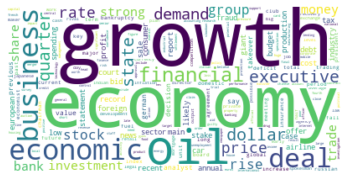

In [41]:
from wordcloud import WordCloud

def makeImage(text, figname):
    wc = WordCloud(background_color="white", max_words=1000)
    # generate word cloud
    wc.generate_from_frequencies(text)

    # show
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.savefig(figname)
    plt.show()

text = cat.loc['sum']
makeImage(text, "../../Bilder/Datenexploration/Wordclouds/wordcloud_Business")

## WordCloud (Entertainment)

In [42]:
ent = df_res[df_res.index=="entertainment"]
ent.loc['sum']=ent.sum()
ent = ent.div(ent.sum(axis=1), axis=0)
ent.sort_values(by=['sum'], axis=1, inplace=True, ascending=False)
ent

film     music      star     award     album  director  \
category                                                                    
entertainment  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
entertainment  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
entertainment  0.078947  0.000000  0.000000  0.026316  0.000000  0.000000   
entertainment  0.000000  0.000000  0.000000  0.074074  0.000000  0.000000   
entertainment  0.103448  0.000000  0.000000  0.000000  0.000000  0.034483   
...                 ...       ...       ...       ...       ...       ...   
entertainment  0.088235  0.000000  0.000000  0.029412  0.000000  0.058824   
entertainment  0.083333  0.000000  0.000000  0.000000  0.000000  0.000000   
entertainment  0.162162  0.000000  0.000000  0.000000  0.000000  0.027027   
entertainment  0.133333  0.000000  0.000000  0.000000  0.000000  0.000000   
sum            0.036224  0.013153  0.011078  0.010309  0.010247  0.010157   

                   band     actor        tv    singer   actress     chart  \
category                                                                    
entertainment  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
entertainment  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
entertainment  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
entertainment  0.000000  0.000000  0.037037  0.000000  0.000000  0.000000   
entertainment  0.000000  0.000000  0.000000  0.000000  0.068966  0.000000   
...                 ...       ...       ...       ...       ...       ...   
entertainment  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
entertainment  0.000000  0.000000  0.000000  0.000000  0.000000  0.027778   
entertainment  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
entertainment  0.000000  0.000000  0.044444  0.000000  0.000000  0.000000   
sum            0.009993  0.009984  0.009363  0.008554  0.007671  0.007493   

                 series   british    comedy     movie      song  festival  \
category                                                                    
entertainment  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
entertainment  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
entertainment  0.026316  0.000000  0.000000  0.026316  0.000000  0.000000   
entertainment  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
entertainment  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
...                 ...       ...       ...       ...       ...       ...   
entertainment  0.000000  0.029412  0.000000  0.000000  0.000000  0.000000   
entertainment  0.000000  0.000000  0.055556  0.111111  0.000000  0.000000   
entertainment  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
entertainment  0.088889  0.000000  0.000000  0.044444  0.000000  0.000000   
sum            0.007221  0.007210  0.007035  0.006408  0.005632  0.005544   

                 record     role  ceremony   musical    single    office  \
category                                                                   
entertainment  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
entertainment  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
entertainment  0.000000  0.00000  0.000000  0.131579  0.000000  0.000000   
entertainment  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
entertainment  0.000000  0.00000  0.000000  0.034483  0.000000  0.000000   
...                 ...      ...       ...       ...       ...       ...   
entertainment  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
entertainment  0.000000  0.00000  0.000000  0.000000  0.000000  0.055556   
entertainment  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
entertainment  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
sum            0.005529  0.00542  0.005353  0.005123  0.005051  0.005014   

                  drama 

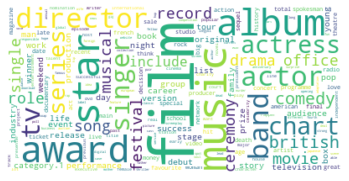

In [43]:
from wordcloud import WordCloud

def makeImage(text, figname):
    wc = WordCloud(background_color="white", max_words=1000)
    # generate word cloud
    wc.generate_from_frequencies(text)

    # show
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.savefig(figname)
    plt.show()

text = ent.loc['sum']
makeImage(text, "../../Bilder/Datenexploration/Wordclouds/wordcloud_Entertainment")

## WordCloud (Politics)

In [44]:
pol = df_res[df_res.index=="politics"]
pol.loc['sum']=pol.sum()
pol = pol.div(pol.sum(axis=1), axis=0)
pol.sort_values(by=['sum'], axis=1, inplace=True, ascending=False)
pol

election     party  minister    leader       tax  campaign  \
category                                                               
politics  0.000000  0.025641  0.000000  0.000000  0.000000  0.000000   
politics  0.000000  0.000000  0.000000  0.015385  0.000000  0.000000   
politics  0.013333  0.000000  0.013333  0.000000  0.000000  0.000000   
politics  0.000000  0.095238  0.000000  0.000000  0.000000  0.000000   
politics  0.094118  0.000000  0.000000  0.000000  0.011765  0.000000   
...            ...       ...       ...       ...       ...       ...   
politics  0.036585  0.000000  0.048780  0.036585  0.000000  0.024390   
politics  0.083333  0.027778  0.000000  0.000000  0.000000  0.166667   
politics  0.023256  0.023256  0.000000  0.046512  0.023256  0.000000   
politics  0.034091  0.113636  0.011364  0.000000  0.034091  0.011364   
sum       0.020499  0.016700  0.009261  0.009077  0.007939  0.007316   

          spokesman   general     local       say      law  secretary  \
category                                                                
politics   0.000000  0.025641  0.000000  0.000000  0.00000   0.000000   
politics   0.000000  0.000000  0.000000  0.000000  0.00000   0.000000   
politics   0.000000  0.000000  0.000000  0.000000  0.00000   0.000000   
politics   0.000000  0.000000  0.000000  0.000000  0.00000   0.000000   
politics   0.000000  0.011765  0.000000  0.000000  0.00000   0.000000   
...             ...       ...       ...       ...      ...        ...   
politics   0.000000  0.024390  0.000000  0.000000  0.00000   0.000000   
politics   0.027778  0.027778  0.000000  0.000000  0.00000   0.000000   
politics   0.000000  0.023256  0.000000  0.000000  0.00000   0.000000   
politics   0.000000  0.011364  0.011364  0.000000  0.00000   0.000000   
sum        0.007263  0.007202  0.005942  0.005923  0.00545   0.005371   

             issue   british  political  chancellor    report  immigration  \
category                                                                     
politics  0.000000  0.000000   0.000000    0.000000  0.000000     0.000000   
politics  0.000000  0.000000   0.000000    0.000000  0.000000     0.000000   
politics  0.000000  0.000000   0.000000    0.000000  0.000000     0.000000   
politics  0.000000  0.000000   0.023810    0.000000  0.000000     0.000000   
politics  0.011765  0.011765   0.011765    0.047059  0.000000     0.000000   
...            ...       ...        ...         ...       ...          ...   
politics  0.024390  0.000000   0.000000    0.000000  0.000000     0.000000   
politics  0.000000  0.000000   0.000000    0.027778  0.000000     0.000000   
politics  0.000000  0.000000   0.023256    0.000000  0.000000     0.023256   
politics  0.000000  0.000000   0.011364    0.000000  0.000000     0.011364   
sum       0.005332  0.005315   0.005290    0.005281  0.004867     0.004463   

               war  chairman     money      anti  programme      want  \
category                                                                
politics  0.000000  0.000000  0.025641  0.000000   0.025641  0.000000   
politics  0.000000  0.015385  0.000000  0.000000   0.000000  0.000000   
politics  0.000000  0.000000  0.000000  0.000000   0.013333  0.013333   
politics  0.000000  0.000000  0.000000  0.000000   0.000000  0.000000   
politics  0.000000  0.000000  0.000000  0.000000   0.011765  0.000000   
...            ...       ...       ...       ...        ...       ...   
politics  0.000000  0.012195  0.000000  0.000000   0.000000  0.000000   
politics  0.000000  0.000000  0.000000  0.000000   0.000000  0.000000   
politics  0.000000  0.000000  0.000000  0.000000   0.000000  0.000000   
politics  0.011364  0.011364  0.011364  0.022727   0.011364  0.011364   
sum       0.003819  0.003812  0.003779  0.003777   0.003688  0.003639   

            health  education    policy       day  decision  committee  \
category                                                                 
politics  

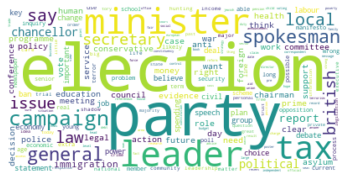

In [45]:
from wordcloud import WordCloud

def makeImage(text, figname):
    wc = WordCloud(background_color="white", max_words=1000)
    # generate word cloud
    wc.generate_from_frequencies(text)

    # show
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.savefig(figname)
    plt.show()

text = pol.loc['sum']
makeImage(text, "../../Bilder/Datenexploration/Wordclouds/wordcloud_Politics")

## WordCloud (Sport)

In [46]:
spo = df_res[df_res.index=="sport"]
spo.loc['sum']=spo.sum()
spo = spo.div(spo.sum(axis=1), axis=0)
spo.sort_values(by=['sum'], axis=1, inplace=True, ascending=False)
spo

team     match     final    season    injury      club     half  \
category                                                                        
sport     0.000000  0.000000  0.000000  0.027778  0.000000  0.000000  0.00000   
sport     0.142857  0.000000  0.000000  0.000000  0.000000  0.000000  0.00000   
sport     0.000000  0.000000  0.057692  0.019231  0.000000  0.000000  0.00000   
sport     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.00000   
sport     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.00000   
...            ...       ...       ...       ...       ...       ...      ...   
sport     0.000000  0.173913  0.000000  0.000000  0.000000  0.000000  0.00000   
sport     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.00000   
sport     0.000000  0.046512  0.023256  0.000000  0.000000  0.000000  0.00000   
sport     0.000000  0.000000  0.107143  0.000000  0.000000  0.000000  0.00000   
sum       0.013337  0.013296  0.011703  0.011586  0.011239  0.011185  0.01063   

            coach       win  champion    player     great   victory     think  \
category                                                                        
sport     0.00000  0.000000  0.000000  0.000000  0.000000  0.000000  0.027778   
sport     0.00000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
sport     0.00000  0.000000  0.000000  0.000000  0.000000  0.000000  0.019231   
sport     0.00000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
sport     0.00000  0.000000  0.071429  0.000000  0.000000  0.000000  0.000000   
...           ...       ...       ...       ...       ...       ...       ...   
sport     0.00000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
sport     0.00000  0.000000  0.047619  0.000000  0.000000  0.000000  0.000000   
sport     0.00000  0.023256  0.023256  0.000000  0.000000  0.023256  0.000000   
sport     0.00000  0.035714  0.035714  0.035714  0.000000  0.000000  0.000000   
sum       0.00996  0.009926  0.008601  0.007602  0.007536  0.007309  0.006503   

           manager    chance     squad     title      race       lot  \
category                                                               
sport     0.000000  0.027778  0.000000  0.055556  0.027778  0.000000   
sport     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
sport     0.000000  0.000000  0.000000  0.057692  0.096154  0.000000   
sport     0.000000  0.000000  0.000000  0.000000  0.000000  0.038462   
sport     0.000000  0.000000  0.000000  0.000000  0.071429  0.000000   
...            ...       ...       ...       ...       ...       ...   
sport     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
sport     0.000000  0.000000  0.000000  0.000000  0.000000  0.047619   
sport     0.000000  0.000000  0.000000  0.069767  0.000000  0.000000   
sport     0.000000  0.000000  0.000000  0.000000  0.000000  0.107143   
sum       0.006415  0.006117  0.006094  0.005975  0.005960  0.005875   

              seed      goal     round  international      boss    record  \
category                                                                    
sport     0.000000  0.000000  0.000000       0.027778  0.000000  0.027778   
sport     0.000000  0.000000  0.000000       0.000000  0.000000  0.000000   
sport     0.000000  0.019231  0.000000       0.000000  0.000000  0.019231   
sport     0.000000  0.000000  0.000000       0.000000  0.000000  0.000000   
sport     0.000000  0.000000  0.000000       0.000000  0.000000  0.142857   
...            ...       ...       ...            ...       ...       ...   
sport     0.086957  0.000000  0.000000       0.000000  0.000000  0.000000   
sport     0.190476  0.000000  0.000000       0.000000  0.000000  0.000000   
sport     0.000000  0.000000  0.023256       0.000000  0.000000  0.000000   
sport     0.107143  0.000000  0.000000       0.000000  0.000000  0.000000   
sum       0.005824  0.005642  0.005580       

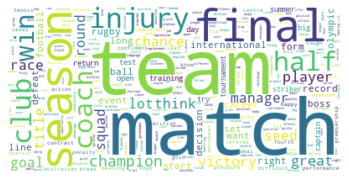

In [47]:
from wordcloud import WordCloud

def makeImage(text, figname):
    wc = WordCloud(background_color="white", max_words=1000)
    # generate word cloud
    wc.generate_from_frequencies(text)

    # show
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.savefig(figname)
    plt.show()

text = spo.loc['sum']
makeImage(text, "../../Bilder/Datenexploration/Wordclouds/wordcloud_Sport")

## WordCloud (Technology)

In [48]:
tech = df_res[df_res.index=="tech"]
tech.loc['sum']=tech.sum()
tech = tech.div(tech.sum(axis=1), axis=0)
tech.sort_values(by=['sum'], axis=1, inplace=True, ascending=False)
tech

technology    mobile  software     music       net  computer  \
category                                                                 
tech        0.018349  0.000000  0.000000  0.000000  0.000000  0.000000   
tech        0.000000  0.000000  0.019231  0.000000  0.269231  0.038462   
tech        0.000000  0.000000  0.094340  0.000000  0.000000  0.000000   
tech        0.000000  0.014925  0.000000  0.000000  0.000000  0.000000   
tech        0.052632  0.000000  0.000000  0.000000  0.006579  0.000000   
...              ...       ...       ...       ...       ...       ...   
tech        0.000000  0.000000  0.065574  0.000000  0.016393  0.000000   
tech        0.005882  0.000000  0.058824  0.000000  0.000000  0.017647   
tech        0.000000  0.000000  0.000000  0.000000  0.057692  0.019231   
tech        0.000000  0.000000  0.000000  0.000000  0.000000  0.009926   
sum         0.013318  0.011767  0.011557  0.010518  0.010368  0.010229   

             phone   service  information     video   digital       use  \
category                                                                  
tech      0.000000  0.000000     0.000000  0.000000  0.000000  0.082569   
tech      0.000000  0.000000     0.000000  0.000000  0.000000  0.019231   
tech      0.000000  0.000000     0.018868  0.000000  0.000000  0.018868   
tech      0.000000  0.000000     0.000000  0.000000  0.014925  0.000000   
tech      0.006579  0.000000     0.000000  0.013158  0.006579  0.000000   
...            ...       ...          ...       ...       ...       ...   
tech      0.000000  0.000000     0.049180  0.000000  0.000000  0.000000   
tech      0.000000  0.000000     0.000000  0.000000  0.000000  0.011765   
tech      0.000000  0.000000     0.019231  0.000000  0.000000  0.000000   
tech      0.000000  0.000000     0.000000  0.009926  0.000000  0.002481   
sum       0.009325  0.008031     0.007733  0.007389  0.007111  0.007099   

          broadband  internet  security        tv     virus      mail  \
category                                                                
tech       0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
tech       0.000000  0.000000  0.000000  0.000000  0.000000  0.019231   
tech       0.000000  0.018868  0.037736  0.000000  0.056604  0.037736   
tech       0.000000  0.000000  0.000000  0.014925  0.000000  0.000000   
tech       0.019737  0.000000  0.000000  0.000000  0.000000  0.000000   
...             ...       ...       ...       ...       ...       ...   
tech       0.000000  0.016393  0.065574  0.000000  0.000000  0.032787   
tech       0.000000  0.000000  0.000000  0.005882  0.000000  0.000000   
tech       0.000000  0.000000  0.019231  0.000000  0.019231  0.000000   
tech       0.000000  0.002481  0.000000  0.012407  0.000000  0.000000   
sum        0.006979  0.006553  0.006472  0.006013  0.006011  0.005980   

            online       web      site    search   content  industry  \
category                                                               
tech      0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
tech      0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
tech      0.018868  0.000000  0.000000  0.000000  0.000000  0.000000   
tech      0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
tech      0.000000  0.006579  0.000000  0.000000  0.000000  0.019737   
...            ...       ...       ...       ...       ...       ...   
tech      0.016393  0.000000  0.000000  0.000000  0.000000  0.016393   
tech      0.005882  0.005882  0.000000  0.000000  0.000000  0.005882   
tech      0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
tech      0.037221  0.000000  0.000000  0.000000  0.000000  0.000000   
sum       0.005637  0.005511  0.005288  0.005226  0.004943  0.004700   

                pc   website      able  research  available  different  \
category                                                                 
tech      0.000000  0.000000  0.0000

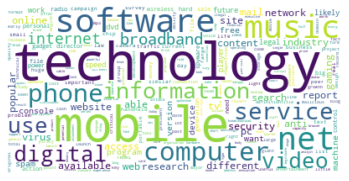

In [49]:
from wordcloud import WordCloud

def makeImage(text, figname):
    wc = WordCloud(background_color="white", max_words=1000)
    # generate word cloud
    wc.generate_from_frequencies(text)

    # show
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.savefig(figname)
    plt.show()

text = tech.loc['sum']
makeImage(text, "../../Bilder/Datenexploration/Wordclouds/wordcloud_Technology")

# Worthäufigkeitsverteilungen nach Kategorien

In [65]:
mfw = df_res.copy()
mfw = mfw.iloc[:,:31]
mfw.dropna()
# mfw = mfw.set_index(mfw.Genre1)
# mfw = mfw.drop("Genre1", axis=1)
mfw

,music,film,election,technology,mobile,party,tv,growth,money,british,economy,think,net,tax,director,group,service,want,industry,half,record,team,business,work,day,phone,big,final,report,economic,software
category,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
business,0.016393,0.032787,0.000000,0.000000,0.000000,0.00000,0.000000,0.016393,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.016393,0.000000,0.000000,0.000000,0.000000,0.00000,0.016393,0.000000,0.000000,0.000000,0.000000,0.016393,0.000000,0.000000,0.000000
business,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.012987,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.012987,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.012987,0.000000,0.000000,0.000000,0.000000
business,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.020408,0.000000,0.000000,0.000000,0.000000,0.040816,0.020408,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
business,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.015385,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
business,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.040000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tech,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.016393,0.000000,0.016393,0.00000,0.000000,0.000000,0.016393,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.016393,0.000000,0.065574
tech,0.000000,0.000000,0.000000,0.005882,0.000000,0.00000,0.005882,0.000000,0.000000,0.005882,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.005882,0.005882,0.000000,0.000000,0.00000,0.000000,0.000000,0.005882,0.000000,0.000000,0.000000,0.000000,0.000000,0.058824
tech,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.057692,0.000000,0.019231,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.038462,0.019231,0.000000,0.019231,0.000000,0.000000,0.000000,0.000000


In [66]:
wolf = mfw[mfw.index=="business"]
wolf.loc['sum']=wolf.sum()
wolf = wolf.div(wolf.sum(axis=1), axis=0)
wolf.sort_values(by=['sum'], axis=1, inplace=True, ascending=False)

In [67]:
sly = mfw[mfw.index=="entertainment"]
sly.loc['sum']=sly.sum()
sly = sly.div(sly.sum(axis=1), axis=0)
sly.sort_values(by=['sum'], axis=1, inplace=True, ascending=False)

In [68]:
trump = mfw[mfw.index=="politics"]
trump.loc['sum']=trump.sum()
trump = trump.div(trump.sum(axis=1), axis=0)
trump.sort_values(by=['sum'], axis=1, inplace=True, ascending=False)

In [69]:
fcb = mfw[mfw.index=="sport"]
fcb.loc['sum']=fcb.sum()
fcb = fcb.div(fcb.sum(axis=1), axis=0)
fcb.sort_values(by=['sum'], axis=1, inplace=True, ascending=False)

In [70]:
apple = mfw[mfw.index=="tech"]
apple.loc['sum']=apple.sum()
apple = apple.div(apple.sum(axis=1), axis=0)
apple.sort_values(by=['sum'], axis=1, inplace=True, ascending=False)

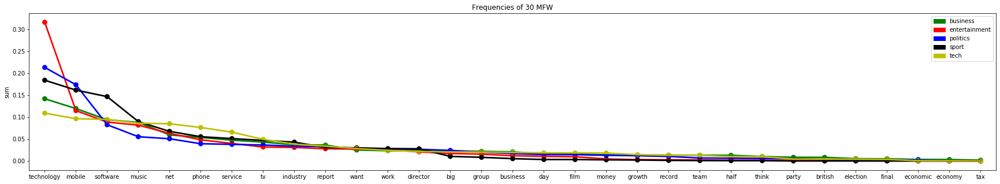

In [85]:
import matplotlib.patches as mpatches
green = mpatches.Patch(color='g', label='business')
red = mpatches.Patch(color='r', label='entertainment')
blue = mpatches.Patch(color='b', label='politics')
black = mpatches.Patch(color='k', label='sport')
yellow = mpatches.Patch(color='y', label='tech')




#  'c' 	cyan
#  'm' 	magenta
#  'y' 	yellow
#  'k' 	black
#  'w' 	white



fig, ax = plt.subplots(figsize=(30,5))
ax = sns.pointplot(x=wolf.columns, y=wolf.loc['sum'],color='g')
ax = sns.pointplot(x=sly.columns, y=sly.loc['sum'], color='r')
ax = sns.pointplot(x=trump.columns, y=trump.loc['sum'], color='b')
ax = sns.pointplot(x=fcb.columns, y=fcb.loc['sum'], color='k')
ax = sns.pointplot(x=apple.columns, y=apple.loc['sum'], color='y')
plt.title("Frequencies of 30 MFW")
plt.legend(handles=[green, red, blue, black, yellow])
plt.savefig("../../Bilder/Datenexploration/MFW30_categroy/freq_30mfw_category")

## Anzahl der Dateien pro Kategorie

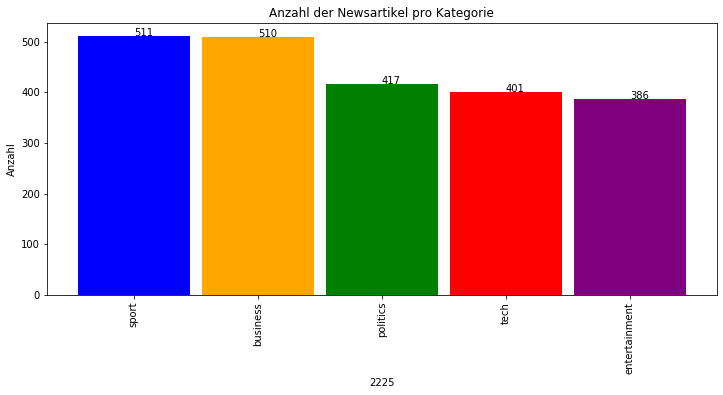

In [75]:
s = df['category'].value_counts().head(5)

import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(figsize=(12,5))

ax=s.plot.bar(width=.9, color=('blue', 'orange', 'green', 'red', 'purple', 'brown')) 
for i, v in s.reset_index().iterrows():
    ax.text(i, v.category + 0.2 , v.category, color='black')

ax.set_xlabel(len(df.category))
plt.title("Anzahl der Newsartikel pro Kategorie")
#plt.xlabel(len(df.Bemerkungen))
plt.ylabel('Anzahl')
#pltcountplotfig("songs_per_genre")
#plt.savefig('../../Bilder/Datenexploration/Anzahl_Laenge_Kategorie/Anzahl_der_Newsartikel_pro_Kategorie.png',
            #bbox_inches = "tight")


# fig, ax = plt.subplots(figsize=(12,5))
# ax = sns.countplot(x = df.category)
# ax.set_xlabel("Kategorien")
# plt.title("Anzahl der Newsartikel pro Kategorie")
# #plt.savefig("songs_per_genre")

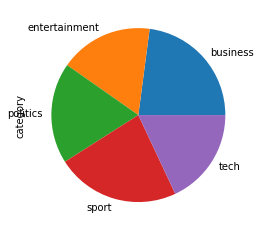

In [81]:
df.groupby(['category']).category.count().plot(kind='pie')

## Artikellänge pro Kategorie

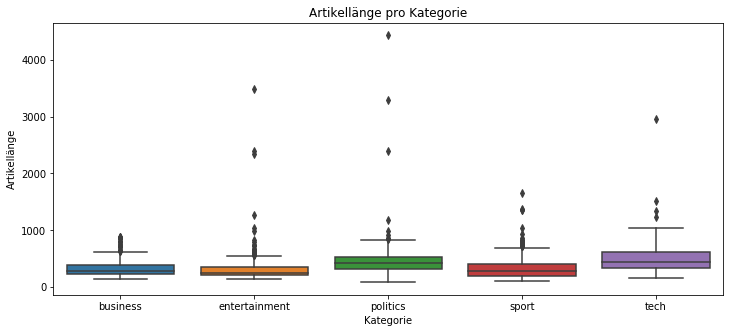

In [82]:
fig, ax = plt.subplots(figsize=(12,5))
sns.boxplot(x=df.category, y=df.number_of_tokens)
ax.set_ylabel("Artikellänge")
ax.set_xlabel("Kategorie")
plt.title("Artikellänge pro Kategorie")
#plt.savefig("../../Bilder/Datenexploration/Anzahl_Laenge_Kategorie/Artikellängen_pro_Kategorie")